In [1]:
include("../speciale_tools.jl")
import JLD
import PyPlot

In [2]:
figure_folder = "/home/data/simon/result/figures_repport/implementation"

"/home/data/simon/result/figures_repport/implementation"

In [3]:
data_folder = "/home/data/simon/processed/test_areas/houston_new"
#data_folder = "/Users/simon/Documents/DTU fag/Speciale/ribe_new"
VV_files,VH_files,coherence_VV_files,coherence_VH_files = _sort_prossed_files(data_folder);
coh = [abs.(band) for band in _load_jld(coherence_VV_files[1:5],data_folder)]
coh = [coh[1][:,end:-1:1],(sum(coh[2:end])./length(coh[2:end]))[:,end:-1:1]];

VV = _load_jld(VV_files[1:6],data_folder)
VV_pre = dropdims(Statistics.median(cat(VV[2:end]...,dims=3),dims=3),dims=3)[:,end:-1:1];
VV_co = copy(VV[1])[:,end:-1:1]
VV = 0;


VH = _load_jld(VH_files[1:6],data_folder)
VH_pre = dropdims(Statistics.median(cat(VH[2:end]...,dims=3),dims=3),dims=3)[:,end:-1:1];
VH_co = copy(VH[1])[:,end:-1:1]
VH = 0;

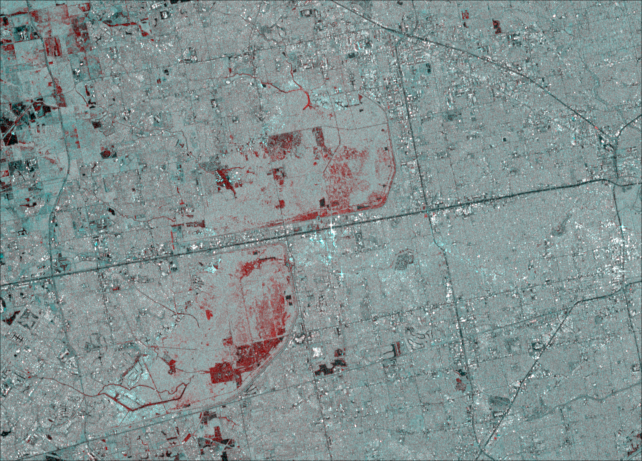

In [4]:
imgVV = pretty_img([VV_co,VV_pre],min_vv,max_vv)
imgVH = pretty_img([VH_co,VH_pre],min_vh,max_vh)

In [5]:
img_bw = pretty_img([VV_co,VV_co],min_vv,max_vv,1);

## HSBA

In [6]:
flood_band = 10 .*log10.(VV_co);
ref_band = 10 .*log10.(VV_pre);
change_band = flood_band .- ref_band;

In [7]:
# Find the tiles to fit bimodal
bm_mask_flood = find_bimodal_tiles(flood_band);
bm_mask_change = find_bimodal_tiles(change_band);
bm_mask = bm_mask_change.&bm_mask_flood;

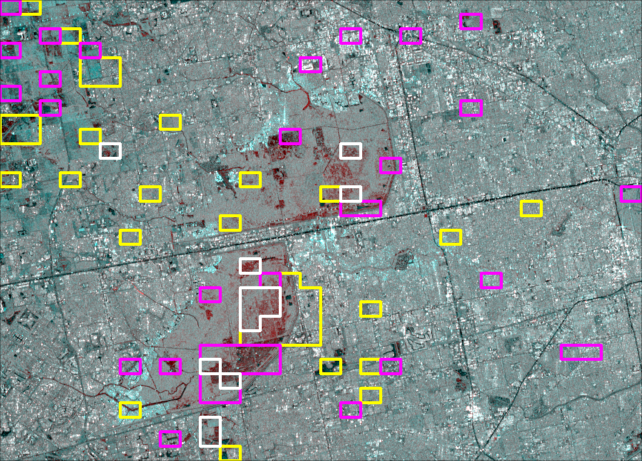

In [18]:
subset_edges = get_edges(bm_mask);
img_save = add_mask(imgVV,get_edges(bm_mask_change),(1,1,0)) # yellow - change
img_save = add_mask(img_save,get_edges(bm_mask_flood),(1,0,1)) # magneta - intense
img_save = add_mask(img_save,get_edges(bm_mask),(1,1,1)) # white

file_path = joinpath(figure_folder,"VV_tile_select")
FileIO.save(file_path*".png",img_save)
img_save

In [8]:
# fit bimodel
data = reshape(flood_band,:)[reshape(bm_mask,:)]
p_fit,y,w,edges, w_sum = fit_bimodal_gauss(data,round(Int64,length(data)/50))

# Find seed pixels
y_seed =find_y_seed(p_fit,y)
seed_mask = flood_band .<y_seed;
y_seed

-13.149999999999999

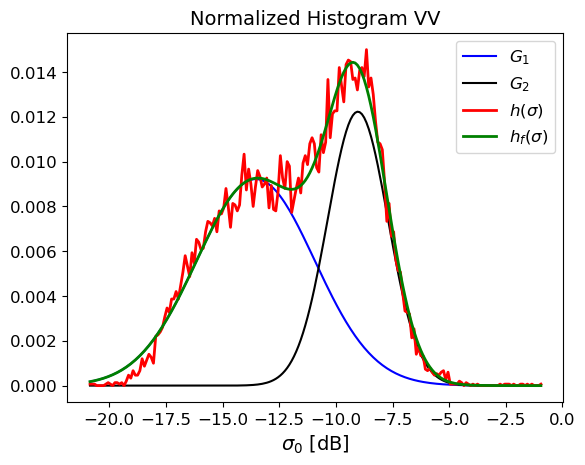

In [17]:
file_path = joinpath(figure_folder,"VV_histogram_tiles.png")
PyPlot.figure()

PyPlot.plot(y,gauss_model(y,p_fit[[1,3,5]]),color="b")
PyPlot.plot(y,gauss_model(y,p_fit[[2,4,6]]),color="k")
PyPlot.plot(y,w,color="r",linewidth=2.0)
#PyPlot.plot(ones(8)*(y_seed),LinRange(minimum(w)-0.0001,maximum(w),8),color="orange")
PyPlot.plot(y,gauss_model(y,p_fit[[1,3,5]]).+gauss_model(y,p_fit[[2,4,6]]),color="green",linewidth=2.0)

PyPlot.xlabel("\$\\sigma_0 \$ [dB]", fontsize=14)
PyPlot.title("Normalized Histogram VV", fontsize=14)
PyPlot.legend(["\$ G_1 \$","\$ G_2 \$","\$ h(\\sigma) \$","\$ h_f(\\sigma) \$"],prop=Dict("size"=> 12))
PyPlot.xticks( fontsize=12)
PyPlot.yticks(fontsize=12)
PyPlot.savefig(file_path)

#### orginal loss function 

In [31]:
test_sigma = collect(LinRange(y_seed,-9,20))
test_dsigma = collect(LinRange(-3,3,20))
@time loss = [sse_water_fit(flood_band,change_band,seed_mask,bm_mask, p_fit[[1,3,5]],w_sum,edges,y, [r1,r2])
    for r1=test_sigma, r2=test_dsigma];

Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
237.213013 seconds (8.77 M allocations: 20.154 GiB, 0.26% gc time)


In [32]:
minimum(loss),maximum(loss)

(0.00011418674573418424, 0.0016774074014212286)

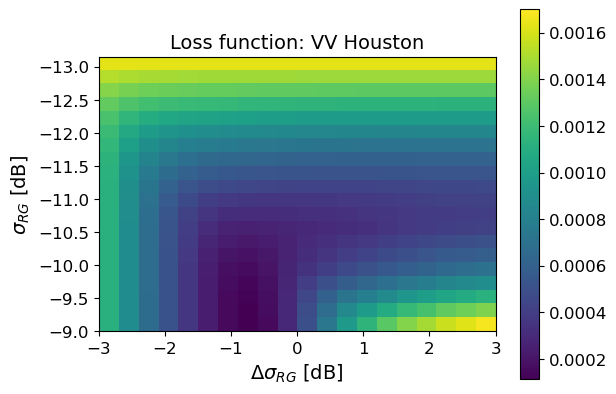

In [41]:
file_path = joinpath(figure_folder,"VV_loss_function.png")
PyPlot.figure(0.001)
PyPlot.imshow(loss,vmin=0.000114,vmax=0.0017
    ,extent=[test_dsigma[1],test_dsigma[end],test_sigma[end],test_sigma[1]])
PyPlot.xlabel("\$\\Delta \\sigma_{RG} \$ [dB]",fontsize=14)
PyPlot.ylabel("\$\\sigma_{RG} \$ [dB]",fontsize=14)
cbar = PyPlot.colorbar()
cbar.ax.tick_params(labelsize=12) 
PyPlot.title("Loss function: VV Houston",fontsize=14)
PyPlot.xticks( fontsize=12)
PyPlot.yticks(fontsize=12)
PyPlot.savefig(file_path)

In [42]:
t_0 = [y_seed+1, -1]
res = Optim.optimize(
    t -> sse_water_fit(flood_band,change_band,seed_mask,bm_mask, p_fit[[1,3,5]],w_sum,edges,y, t), 
    t_0)
thresholds1 = res.minimizer
f1 = sse_water_fit(flood_band,change_band,seed_mask,bm_mask, p_fit[[1,3,5]],w_sum,edges,y,thresholds1)
thresholds1, f1

([-2.581226539611814, -0.7614544868469237], 0.00010867125308207383)

### Second loss function 

In [43]:
test_sigma = collect(LinRange(y_seed,-9,20))
test_dsigma = collect(LinRange(-3,3,20))
@time loss = [sse_water_fit2(flood_band,change_band,ref_band,y_seed,bm_mask, p_fit[[1,3,5]],w_sum,edges,y, [r1,r2])
    for r1=test_sigma, r2=test_dsigma];

Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_gr

In [44]:
minimum(loss),maximum(loss)

(0.000852824756548782, 0.0034397156789901487)

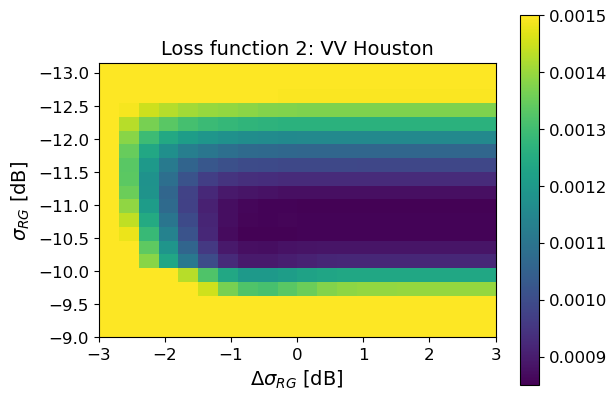

In [49]:
file_path = joinpath(figure_folder,"VV_loss2_function.png")
PyPlot.figure(0.001)
PyPlot.imshow(loss,vmin=0.00085,vmax=0.0015
    ,extent=[test_dsigma[1],test_dsigma[end],test_sigma[end],test_sigma[1]])
PyPlot.xlabel("\$\\Delta \\sigma_{RG} \$ [dB]",fontsize=14)
PyPlot.ylabel("\$\\sigma_{RG} \$ [dB]",fontsize=14)
cbar = PyPlot.colorbar()
cbar.ax.tick_params(labelsize=12) 
PyPlot.title("Loss function 2: VV Houston",fontsize=14)
PyPlot.xticks( fontsize=12)
PyPlot.yticks(fontsize=12)
PyPlot.savefig(file_path)

In [9]:
t_0 = [y_seed+1, -1]
res = Optim.optimize(
    t -> sse_water_fit2(flood_band,change_band,ref_band,y_seed,bm_mask, p_fit[[1,3,5]],w_sum,edges,y, t), 
    t_0)
thresholds1 = res.minimizer
f1 = sse_water_fit2(flood_band,change_band,ref_band,y_seed,bm_mask, p_fit[[1,3,5]],w_sum,edges,y,thresholds1)
thresholds1, f1

Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()


([-10.842833137512208, -0.48252263069152856], 0.0008408775103374089)

In [18]:
thresholds1=[-10.842833137512208, -0.48252263069152856];

In [19]:
rg_mask = (flood_band .<thresholds1[1]) .& (change_band.<thresholds1[2]) .| seed_mask 
flood_mask, steps = region_growing(seed_mask,rg_mask);

In [20]:
# select the water pixelss in the selected tiles
data = reshape(flood_band,:)[reshape(rg_mask.&bm_mask,:)];
    
# Compare histogram with the emepircal in p_water
h = StatsBase.fit(StatsBase.Histogram, data,edges)
w_sel = h.weights./w_sum;

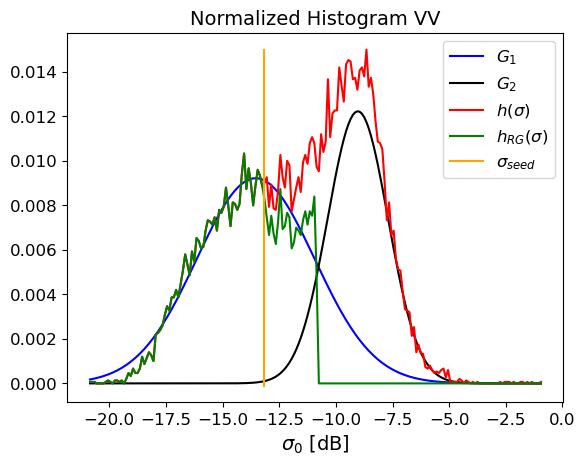

In [54]:
file_path = joinpath(figure_folder,"VV_histogram_flood.png")
PyPlot.figure()

PyPlot.plot(y,gauss_model(y,p_fit[[1,3,5]]),color="b")
PyPlot.plot(y,gauss_model(y,p_fit[[2,4,6]]),color="k")
PyPlot.plot(y,w,color="r")
PyPlot.plot(y,w_sel,color="g")
PyPlot.plot(ones(8)*(y_seed),LinRange(minimum(w)-0.0001,maximum(w),8),color="orange")

PyPlot.xlabel("\$\\sigma_0 \$ [dB]",fontsize=14)
PyPlot.title("Normalized Histogram VV",fontsize=14)
PyPlot.legend(["\$ G_1 \$","\$ G_2 \$","\$ h(\\sigma) \$","\$ h_{RG}(\\sigma) \$" ,"\$\\sigma_{seed} \$"],
    prop=Dict("size"=> 12))

PyPlot.xticks( fontsize=12)
PyPlot.yticks(fontsize=12)

PyPlot.savefig(file_path)

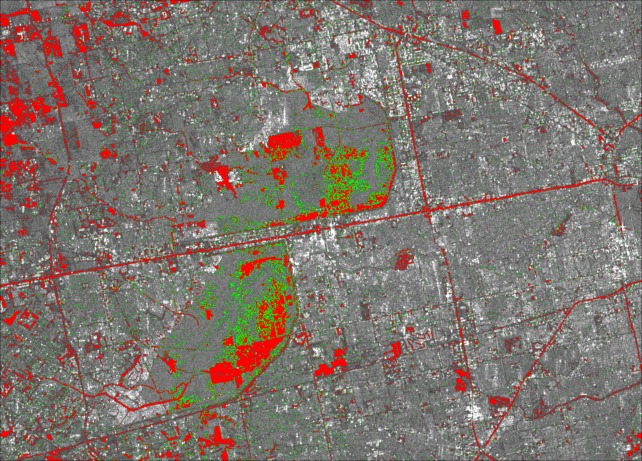

In [21]:
img_save = add_mask(img_bw,rg_mask,(0,1,0)) # magneta - seed pixels
img_save = add_mask(img_save,seed_mask,(1,0,0)) # yellow - candidate pixels 



file_path = joinpath(figure_folder,"VV_seed_can")
FileIO.save(file_path*".png",img_save)
img_save

In [12]:
seed_mask_ref = ref_band .<y_seed
rg_mask_ref = (ref_band .<thresholds1[1]) .| seed_mask_ref
ref_mask, steps = region_growing(seed_mask_ref,rg_mask_ref);

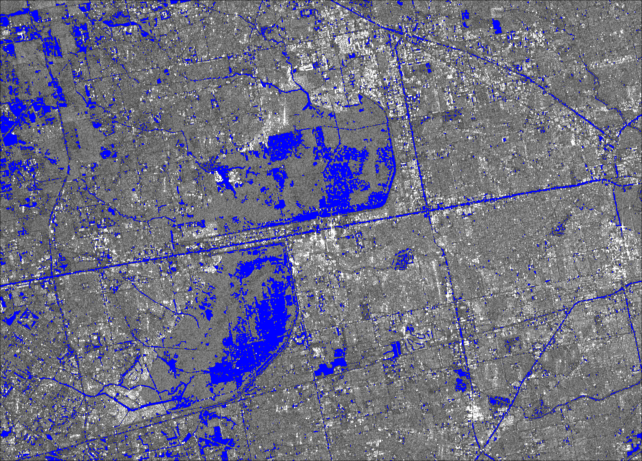

In [13]:
img_save = add_mask(img_bw,flood_mask,(0,0,1)) # 

file_path = joinpath(figure_folder,"VV_flood_noref")
FileIO.save(file_path*".png",img_save)
img_save

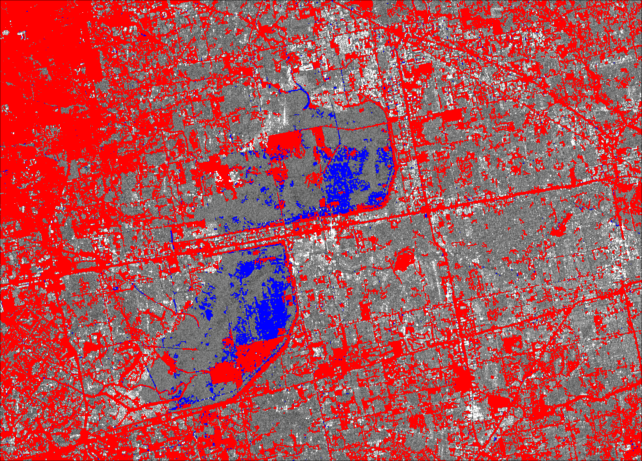

In [64]:
img_save = add_mask(img_bw,flood_mask,(0,0,1)) # 
img_save = add_mask(img_save,ref_mask,(1,0,0)) #  

file_path = joinpath(figure_folder,"VV_flood_permanent")
FileIO.save(file_path*".png",img_save)
img_save

In [70]:
final_mask = flood_mask .& .!(ref_mask);

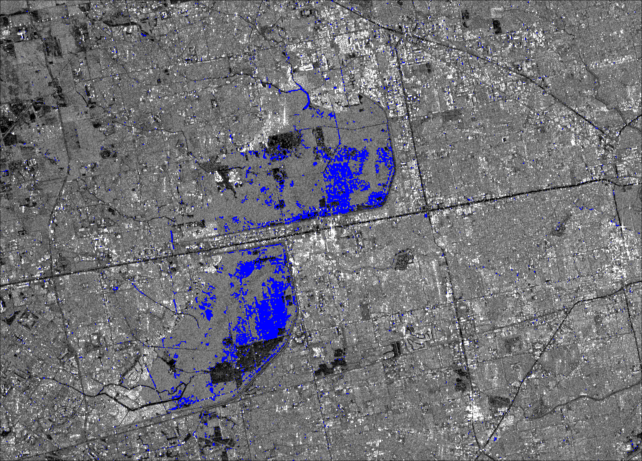

In [71]:
img_save = add_mask(img_bw,final_mask,(0,0,1)) # 

file_path = joinpath(figure_folder,"VV_flood")
FileIO.save(file_path*".png",img_save)
img_save

In [72]:
file_name = joinpath(data_folder,"hsba_VV.jld")
JLD.save(file_name, "data",final_mask);

## Bulding Detection 

In [73]:
function find_double_tiles(data,min_mu2; N_limit = (0.5*10^3, 3*10^5), bin_size=50,conditions=(2,0.2),max_iter=10000)
    #println("Function call")
    # initialize mask
    dims = size(data)
    N =  dims[1]*dims[2]
    BM_mask = zeros(Bool,dims...)
    
    # If area is to small return false and exit function
    # serves as a lower limit for the recursive function
    if N < N_limit[1]
        return BM_mask
    end
    
    # If N is under max limit check for bimodal 
    bm_tile = false
    if N < N_limit[2]
        n_bins = round(Int64,N/bin_size)
        bm_tile, cons, p_fit = double_tile(reshape(data,:),n_bins,min_mu2,conditions=conditions,max_iter=max_iter)
        if bm_tile
            println("")
            println("Sucess")
            println("p_fit: $p_fit")
            println("cons: $cons")
        end
    end
    
    
    if bm_tile
        BM_mask .= true
    else
        # If tile not bimodal, Split it in 4 and try again
        row_split = floor(Int64,dims[1]/2)
        col_split = floor(Int64,dims[2]/2)
        
        tiles = [(1:row_split,1:col_split),((row_split+1):dims[1],1:col_split),
            (1:row_split,(col_split+1):dims[2]),((row_split+1):dims[1],(col_split+1):dims[2])]
        
        for elem in tiles
            BM_mask[elem...] .= find_double_tiles(data[elem...], min_mu2,
                N_limit =N_limit, bin_size=bin_size,conditions=conditions,max_iter=max_iter)
        end
        
    end
    
    return BM_mask
end

function double_tile(data,n_bins,min_mu2;max_iter=10000,conditions=(2,0.2))
    p_fit,y,w,edges,w_sum = fit_bimodal_gauss(data,n_bins,max_iter)
    
    ad = sqrt(2)*abs(p_fit[3]-p_fit[4])/sqrt(p_fit[5]^2+p_fit[6]^2)
    sr = minimum([p_fit[1]*p_fit[5],p_fit[2]*p_fit[6]])/maximum([p_fit[1]*p_fit[5],p_fit[2]*p_fit[6]])
    
    mu_high = maximum([p_fit[3],p_fit[4]])    
    
    #acceptable_sigma = maximum([p_fit[5],p_fit[6]]) <10
    
    BM_tile = (ad>conditions[1])&(sr>conditions[2])&( mu_high >min_mu2)
    
    return BM_tile, [ad,sr,mu_high], p_fit
end

function find_y_seed2(p_fit,y,min_ratio = 0.99)
    p_water = p_fit[[1,3,5]]
    p_nonwater = p_fit[[2,4,6]]
     ratio = gauss_model(y,p_nonwater)./bimodal_gauss_model(y, p_fit);
    y_seed = y[y.>p_water[2]][findfirst(ratio[y.>p_water[2]] .>min_ratio)]
    return y_seed
end


function sse_water_fit_double(band,bm_mask, p_target,w_sum,edges,y, rg_thresholds)
    #use region growinf

    rg_mask, steps = region_growing(band .> rg_thresholds[1],band .> rg_thresholds[2]);
    
    # select the water pixelss in the selected tiles
    data = reshape(band,:)[reshape(rg_mask.&bm_mask,:)];
    
    # Compare histogram with the emepircal in p_water
    h = StatsBase.fit(StatsBase.Histogram, data,edges)
    w_sel = h.weights./w_sum;
    w_water_est = gauss_model(y,p_target)
    
    # return sum of squred errors
    SSE = (w_sel .- w_water_est)'*(w_sel .- w_water_est)
    return SSE
end


sse_water_fit_double (generic function with 1 method)

In [74]:
data_folder = "/home/data/simon/processed/test_areas/houston_long/means"
#figure_folder = "/home/data/simon/result/HSBA_loss2/HSBA_houston"

"/home/data/simon/processed/test_areas/houston_long/means"

In [77]:

VV = JLD.load(joinpath(data_folder,"VV_mean.jld"),"data")[:,end:-1:1]
VH = JLD.load(joinpath(data_folder,"VH_mean.jld"),"data")[:,end:-1:1]
gamma = JLD.load(joinpath(data_folder,"gamma_mean.jld"),"data")[:,end:-1:1];

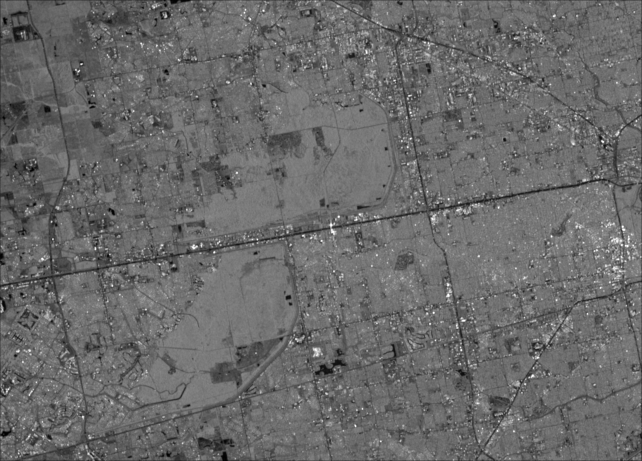

In [78]:
imgVV = pretty_img([VV,VV],min_vv,max_vv,1)
imgVH = pretty_img([VH,VH],min_vh,max_vh,1)

In [79]:
VV = 10 .*log10.(VV);
VH = 10 .*log10.(VH);

In [80]:
min_mu2 = -3
# Find the tiles to fit bimodal
bm_mask_VV = find_double_tiles(VV,min_mu2);


Sucess
p_fit: [0.1535806111239885, 0.0653549831014454, -9.864925488721584, -0.6051849149928478, 3.283614379829173, 4.659624516205612]
cons: [2.297263075286615, 0.6038667093933486, -0.6051849149928478]

Sucess
p_fit: [0.11993421325872844, 0.029256199657640595, -9.481445333861451, -2.7008270567119794, 2.68969171763037, 2.7867176831379186]
cons: [2.475912164723688, 0.25273494121711426, -2.7008270567119794]

Sucess
p_fit: [0.18131335222791878, 0.09504492119857642, -8.93496797933864, 0.04313425723082843, 1.7026397847253305, 5.001548803018902]
cons: [2.4031718623235583, 0.6494102496345275, 0.04313425723082843]

Sucess
p_fit: [0.14491789472043157, 0.031072650485429502, -8.83506824248595, -2.6675408492765684, 1.9365981966800387, 3.8289673926963217]
cons: [2.0327437412675193, 0.42393417539745853, -2.6675408492765684]


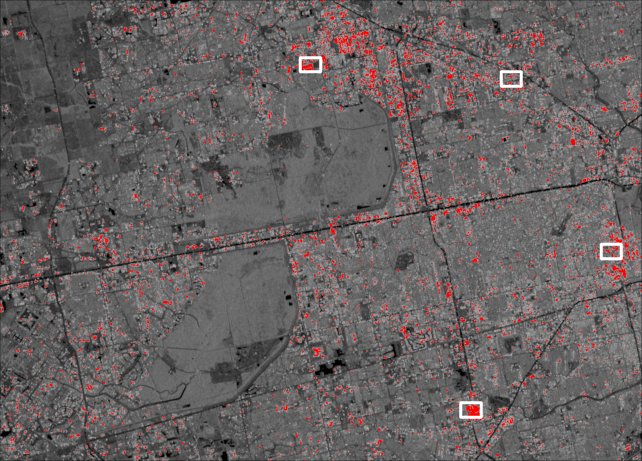

In [85]:
subset_edges = get_edges(bm_mask_VV );
img_save = add_mask(imgVV,VV.>min_mu2,(1,0,0))
img_save = add_mask(img_save,get_edges(bm_mask_VV ),(1,1,1))

file_path = joinpath(figure_folder,"building_VV_tiles")
FileIO.save(file_path*".png",img_save)
img_save

In [83]:
min_mu1 = -7
# Find the tiles to fit bimodal
bm_mask_VH = find_double_tiles(VH,min_mu2);

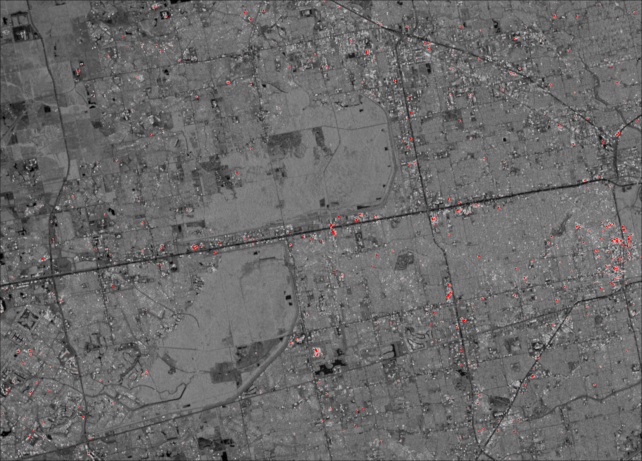

In [86]:
subset_edges = get_edges(bm_mask_VH );
img_save = add_mask(imgVH,VH.>min_mu1,(1,0,0))
img_save = add_mask(img_save,get_edges(bm_mask_VH ),(1,1,1))

file_path = joinpath(figure_folder,"building_VH_tiles")
FileIO.save(file_path*".png",img_save)
img_save

In [87]:
# fit bimodel
data = reshape(VV,:)[reshape(bm_mask_VV,:)]
p_fit,y,w,edges, w_sum = fit_bimodal_gauss(data,round(Int64,length(data)/50))

y_seed = find_y_seed2(p_fit,y)

-2.25

In [90]:
res = Optim.optimize(
    t -> sse_water_fit_double(VV,bm_mask_VV,
                    p_fit[[2,4,6]],w_sum,edges,y, [y_seed,t]),
    p_fit[3], y_seed)

y_RG = res.minimizer

-7.2646980987394985

In [91]:
res

Results of Optimization Algorithm
 * Algorithm: Brent's Method
 * Search Interval: [-9.185249, -2.250000]
 * Minimizer: -7.264698e+00
 * Minimum: 1.815502e-03
 * Iterations: 27
 * Convergence: max(|x - x_upper|, |x - x_lower|) <= 2*(1.5e-08*|x|+2.2e-16): true
 * Objective Function Calls: 28

In [93]:

VV_double_mask, steps = region_growing(VV .> y_seed,
                                VV .> y_RG);

In [94]:
# select the water pixelss in the selected tiles
data = reshape(VV,:)[reshape(VV_double_mask.&bm_mask_VV,:)];
    
# Compare histogram with the emepircal in p_water
h = StatsBase.fit(StatsBase.Histogram, data,edges)
w_sel = h.weights./w_sum;

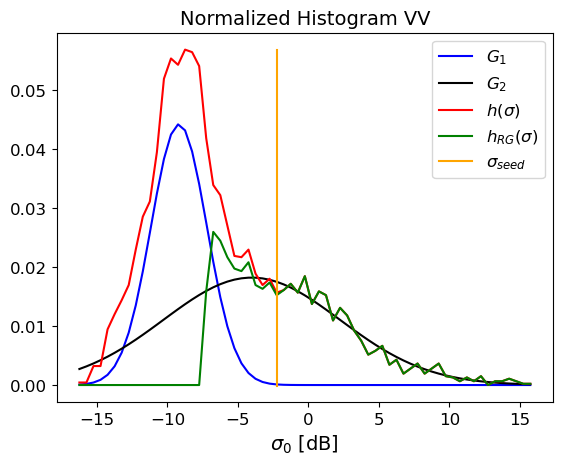

In [95]:
file_path = joinpath(figure_folder,"VV_histogram_buildings.png")
PyPlot.figure()
PyPlot.plot(y,gauss_model(y,p_fit[[1,3,5]]),color="b")
PyPlot.plot(y,gauss_model(y,p_fit[[2,4,6]]),color="k")
PyPlot.plot(y,w,color="r")
PyPlot.plot(y,w_sel,color="g")
PyPlot.plot(ones(8)*(y_seed),LinRange(minimum(w)-0.0001,maximum(w),8),color="orange")

PyPlot.xlabel("\$\\sigma_0 \$ [dB]", fontsize=14)
PyPlot.title("Normalized Histogram VV", fontsize=14)
PyPlot.legend(["\$ G_1 \$","\$ G_2 \$","\$ h(\\sigma) \$","\$ h_{RG}(\\sigma) \$" ,"\$\\sigma_{seed} \$"]
    ,prop=Dict("size"=> 12))
PyPlot.xticks( fontsize=12)
PyPlot.yticks(fontsize=12)

PyPlot.savefig(file_path)

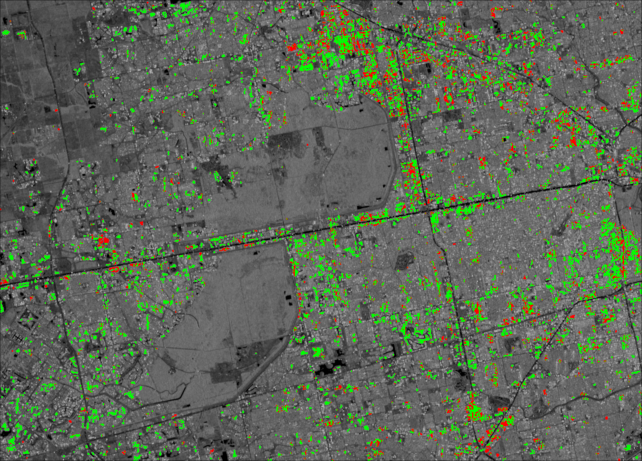

In [101]:

img_save = add_mask(imgVV,VV_double_mask ,(1,0,0)) #
img_save = add_mask(img_save,VV_double_mask .& (gamma.>0.5),(0,1,0)) # 

file_path = joinpath(figure_folder,"bulding_coh")
FileIO.save(file_path*".png",img_save)
img_save

In [102]:

data_folder2 = "/home/data/simon/processed/test_areas/houston_new"
file_name = joinpath(data_folder2,"hsba_building.jld")
JLD.save(file_name, "data",VV_double_mask .& (gamma.>0.5));

In [104]:
own_building = VV_double_mask .& (gamma.>0.5);

### Urban flood 

In [106]:
own_urban = ((coh[1] .- coh[2]) .< -0.25) .& own_building;

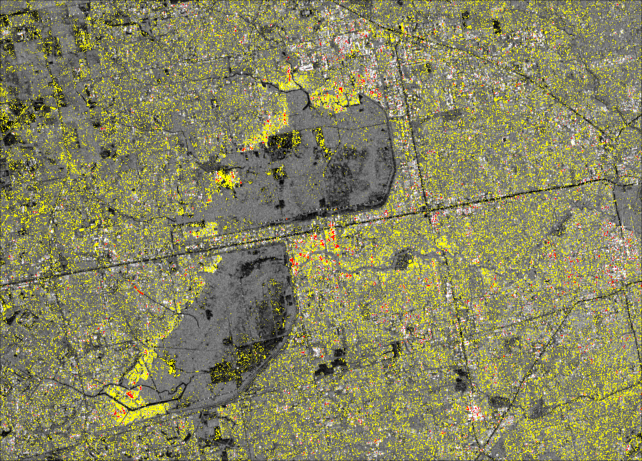

In [112]:
img_save = add_mask(img_bw,(coh[1] .- coh[2]) .< -0.25 ,(1,1,0)) 
img_save = add_mask(img_save ,own_urban,(1,0,0)) # 

file_path = joinpath(figure_folder,"urban_flood_own_buldings")
FileIO.save(file_path*".png",img_save)
img_save

In [108]:
### Still want to test the coherence processed in the thesis fr urban flood

## Change driven approach

In [14]:
figure_folder = "/home/data/simon/result/figures_repport/implementation"

"/home/data/simon/result/figures_repport/implementation"

In [15]:
data_folder = "/home/data/simon/processed/test_areas/houston_new"
#data_folder = "/Users/simon/Documents/DTU fag/Speciale/ribe_new"
VV_files,VH_files,coherence_VV_files,coherence_VH_files = _sort_prossed_files(data_folder);
coh = [abs.(band) for band in _load_jld(coherence_VV_files[1:5],data_folder)]
coh = [coh[1][:,end:-1:1],(sum(coh[2:end])./length(coh[2:end]))[:,end:-1:1]];

VV = _load_jld(VV_files[1:6],data_folder)
VV_pre = dropdims(Statistics.median(cat(VV[2:end]...,dims=3),dims=3),dims=3)[:,end:-1:1];
VV_co = copy(VV[1])[:,end:-1:1]
VV = 0;


VH = _load_jld(VH_files[1:6],data_folder)
VH_pre = dropdims(Statistics.median(cat(VH[2:end]...,dims=3),dims=3),dims=3)[:,end:-1:1];
VH_co = copy(VH[1])[:,end:-1:1]
VH = 0;

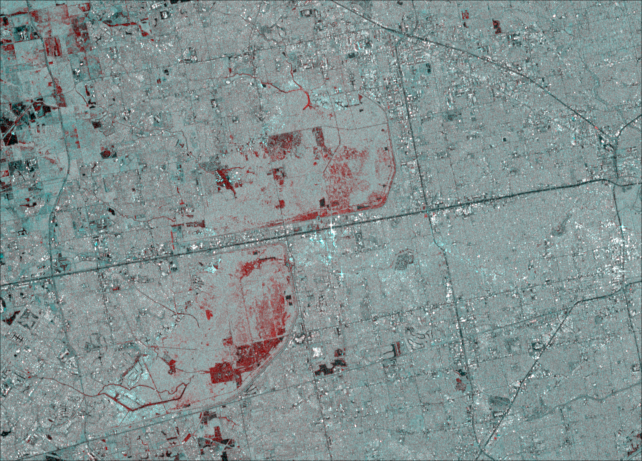

In [16]:
imgVV = pretty_img([VV_co,VV_pre],min_vv,max_vv)
imgVH = pretty_img([VH_co,VH_pre],min_vh,max_vh)

In [17]:
img_bw = pretty_img([VV_co,VV_co],min_vv,max_vv,1);

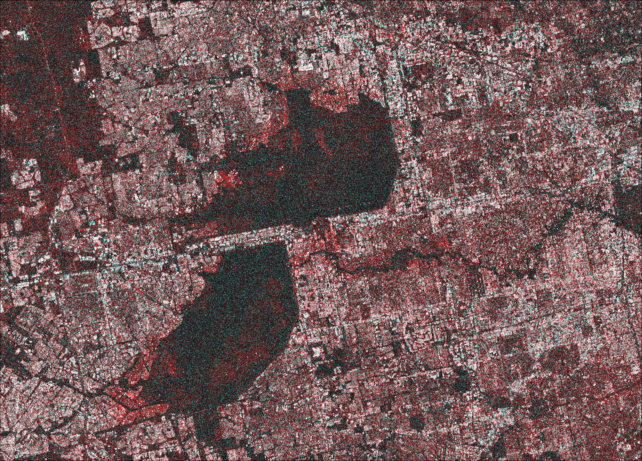

In [18]:
 img_coh = Colors.RGB.(coh[2],coh[1],coh[1])

In [6]:
VV_co = 10 .*log10.(VV_co)
VV_pre = 10 .*log10.(VV_pre)
VH_co = 10 .*log10.(VH_co)
VH_pre = 10 .*log10.(VH_pre)

delta_VV = VV_co .- VV_pre
delta_VH = VH_co .- VH_pre
delta_coh = coh[1] .- coh[2];

#### Bare soil

In [24]:
sure_red = (delta_VV.<-2)  .& (delta_VH.<-2) .& (VV_co .< -3) .& (VH_co .< -7);

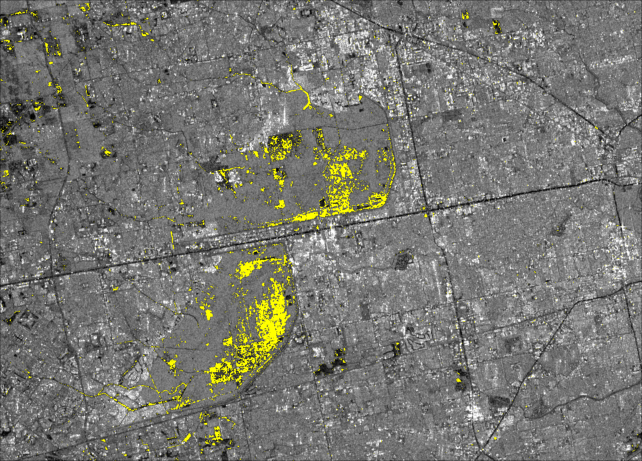

In [25]:
img_save = add_mask(img_bw,sure_red ,(1,1,0))

file_path = joinpath(figure_folder,"own_train")
FileIO.save(file_path*".png",img_save)
img_save

In [26]:
sure_red_VV = vec(VV_co[sure_red])
sure_red_VH = vec(VH_co[sure_red]);

In [27]:
mu_flood = [Statistics.mean(sure_red_VV),Statistics.mean(sure_red_VH)]

2-element Array{Float64,1}:
 -15.066459042773284
 -21.05159552783195 

In [28]:
sigma_flood = Statistics.cov(cat(sure_red_VV,sure_red_VH, dims=2), dims=1)

2×2 Array{Float64,2}:
 5.76296  4.57186
 4.57186  6.24515

In [1]:
4.57186/sqrt(5.76296*6.24515)

0.762076699566868

In [58]:
x,y = Misc.flatten(-22:0.01:-7,-30:0.01:-12);
mal = get_malhob(x,y,mu_flood,sigma_flood);
distri = Distributions.Chisq(2)
limit = Distributions.quantile.(distri, 0.90)
idx = (limit.<mal ).&( mal.<limit+0.1)
sum(idx)

12212

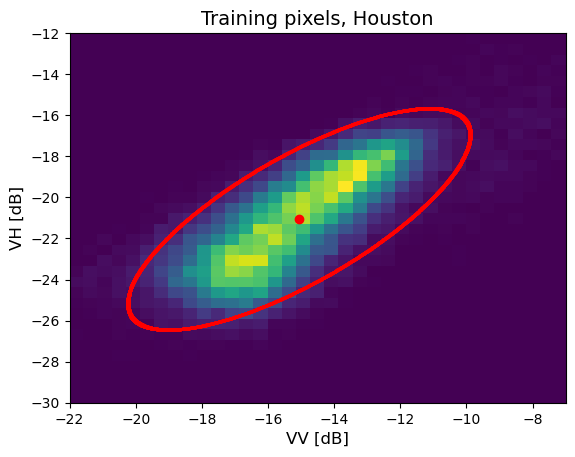

In [59]:
file_path = joinpath(figure_folder,"own_2dhist_train.png")
fig, axes = PyPlot.subplots()
axes.hist2d(sure_red_VV ,sure_red_VH,bins=35,range=[[-22,-7],[-30,-12]]);
axes.scatter(mu_flood[1],mu_flood[2],color="r")
axes.scatter(x[idx],y[idx],color="r",s=1)
PyPlot.xlabel("VV [dB]", fontsize=12)
PyPlot.ylabel("VH [dB]", fontsize=12)
PyPlot.title("Training pixels, Houston",fontsize=14)
PyPlot.savefig(file_path)

In [61]:
seed_mask = (delta_VV.<-2) .& (VV_co .< mu_flood[1]) .& (delta_VH.<-2) .& (VH_co .< mu_flood[2]);

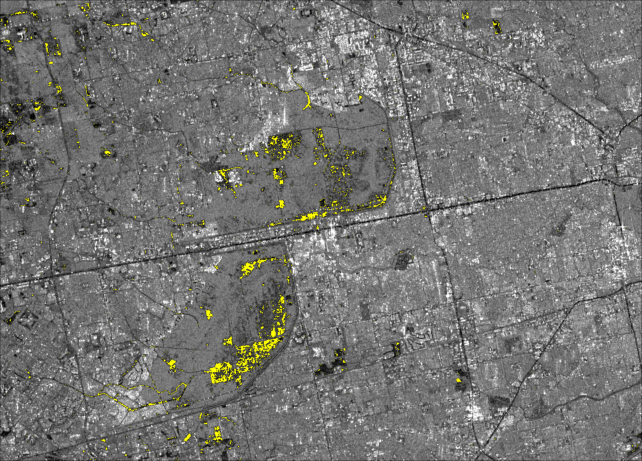

In [62]:
img_save = add_mask(img_bw,seed_mask ,(1,1,0))

file_path = joinpath(figure_folder,"own_seed_bare_soil")
FileIO.save(file_path*".png",img_save)
img_save

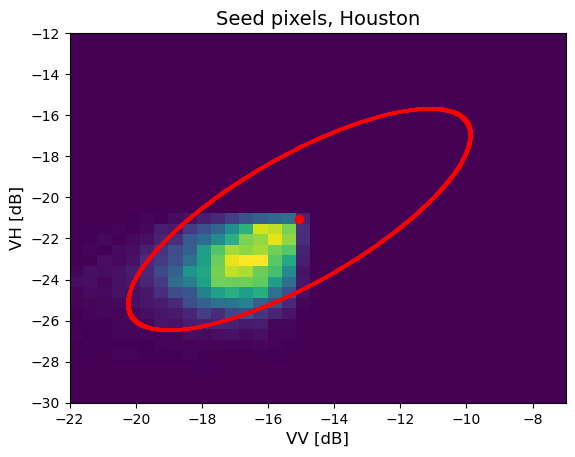

In [64]:
file_path = joinpath(figure_folder,"own_2dhist_seed.png")
fig, axes = PyPlot.subplots()
axes.hist2d(vec(VV_co[seed_mask]) ,vec(VH_co[seed_mask]),bins=35,range=[[-22,-7],[-30,-12]]);
axes.scatter(mu_flood[1],mu_flood[2],color="r")
axes.scatter(x[idx],y[idx],color="r",s=1)
PyPlot.xlabel("VV [dB]", fontsize=12)
PyPlot.ylabel("VH [dB]", fontsize=12)
PyPlot.title("Seed pixels, Houston",fontsize=14)
PyPlot.savefig(file_path)

In [66]:
rg_mask_change = ((delta_VV.<-2) .& (delta_VH.<0)) .| 
                ((delta_VV.<0) .& (delta_VH.<-2)) .| ( ( (delta_VV .+2).^2 .+ (delta_VH .+2).^2) .< 4 );

In [67]:
test_d = collect(1:0.1:12);
dist_cir = (VV_co.-mu_flood[1]).^2 .+ (VH_co .-mu_flood[2]).^2
loss_mal = [loss_rg_fit(VV_co,VH_co, seed_mask, rg_mask_change,mu_flood,sigma_flood,dist_cir, d.^2) for d in test_d ];

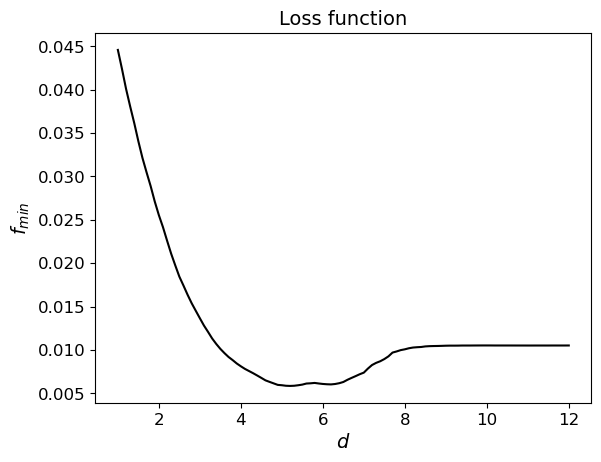

In [71]:
file_path = joinpath(figure_folder,"own_loss_d.png")
PyPlot.figure()
PyPlot.plot(test_d,loss_mal,color="k")
PyPlot.xlabel("\$ d \$", fontsize=14)
PyPlot.ylabel("\$ f_{min} \$", fontsize=14)
PyPlot.xticks( fontsize=12)
PyPlot.yticks(fontsize=12)
PyPlot.title("Loss function", fontsize=14)
PyPlot.savefig(file_path)

In [72]:
res = Optim.optimize(
    d -> loss_rg_fit(VV_co,VH_co, seed_mask, rg_mask_change,mu_flood,sigma_flood,dist_cir, d.^2),
    0, 10);

In [73]:
d_min = res.minimizer

6.211443317162976

In [74]:
rg_mask_int = ((VV_co .< mu_flood[1]) .& (VH_co .< mu_flood[2])) .| (dist_cir .< d_min.^2);

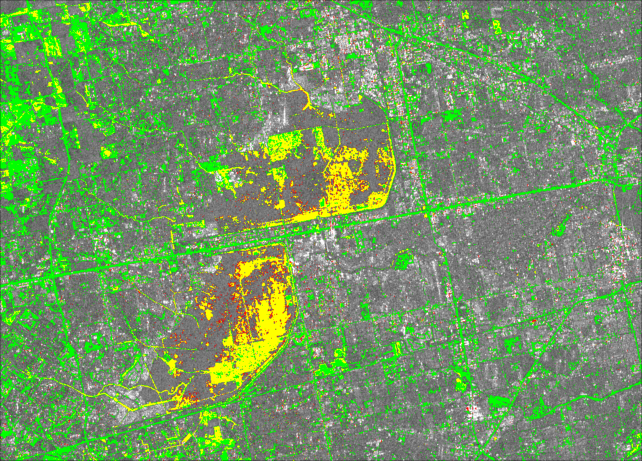

In [77]:
img_save = add_mask(img_bw,rg_mask_int  ,(0,1,0)) ### Only intens
img_save = add_mask(img_save,rg_mask_change ,(1,0,0)) ### red only change
img_save = add_mask(img_save,rg_mask_int .& rg_mask_change ,(1,1,0))### Yellow. Candi by combine

file_path = joinpath(figure_folder,"own_can_pixels")
FileIO.save(file_path*".png",img_save)
img_save

In [80]:
flood,steps = region_growing(seed_mask,rg_mask_int .& rg_mask_change);

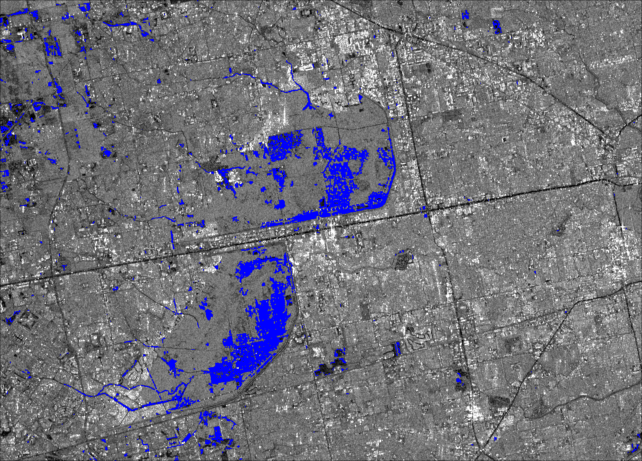

In [82]:
img_save = add_mask(img_bw,flood ,(0,0,1))

file_path = joinpath(figure_folder,"own_bare_soil")
FileIO.save(file_path*".png",img_save)
img_save

In [83]:

file_name = joinpath(data_folder,"own_bare_soil.jld")
JLD.save(file_name, "data",flood);

In [85]:
d_min

6.211443317162976

In [91]:

d_cir2 = ((x.-mu_flood[1]).^2 .+ (y.-mu_flood[2]).^2)
idx2 = (d_min^2 .<d_cir2 ).&(d_cir2 .<d_min^2 +0.2) .& (x .> mu_flood[1]) .& (y .> mu_flood[2])
sum(idx2)

1575

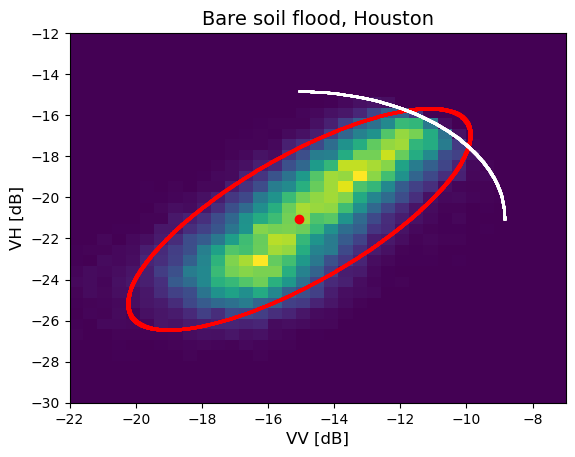

In [104]:
file_path = joinpath(figure_folder,"own_2dhist_bare_soil.png")
fig, axes = PyPlot.subplots()
axes.hist2d(vec(VV_co[flood]) ,vec(VH_co[flood]),bins=35,range=[[-22,-7],[-30,-12]]);
axes.scatter(mu_flood[1],mu_flood[2],color="r")
axes.scatter(x[idx],y[idx],color="r",s=1)
axes.scatter(x[idx2],y[idx2],color="w",s=1)
PyPlot.xlabel("VV [dB]", fontsize=12)
PyPlot.ylabel("VH [dB]", fontsize=12)
PyPlot.title("Bare soil flood, Houston",fontsize=14)
PyPlot.savefig(file_path)

## Urban flood

In [7]:
sure_cyan = (delta_VV.>5) .& (coh[2].> 0.5)  .& (coh[1].< 0.25) .& (VV_pre.>-10) #.& (delta_VH.> 0) 
rg_mask = (delta_VV.>3) .& ((delta_coh .< -0.25));

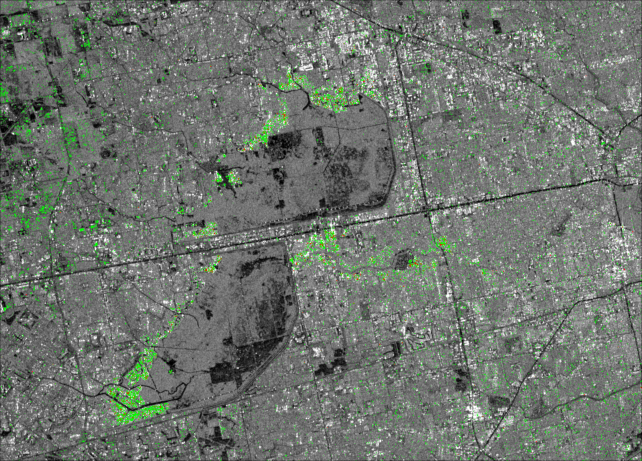

In [8]:
img_save = add_mask(img_bw,rg_mask  ,(0,1,0)) ### Only intens
img_save = add_mask(img_save,sure_cyan ,(1,0,0)) ### red only change

file_path = joinpath(figure_folder,"own_urban_rg")
FileIO.save(file_path*".png",img_save)
img_save

In [8]:
sum(rg_mask)

36243

In [9]:
sum(sure_cyan)

2150

In [10]:
urban_flood,steps = region_growing(sure_cyan,rg_mask );

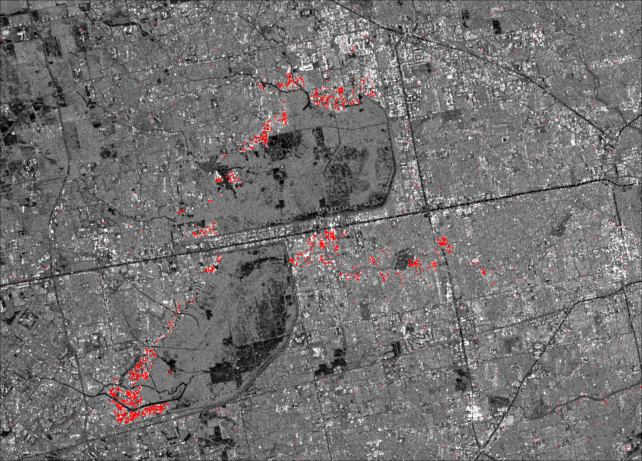

In [11]:
img_save = add_mask(img_bw,urban_flood ,(1,0,0)) ### Only intens
file_path = joinpath(figure_folder,"own_urban_flood")
FileIO.save(file_path*".png",img_save)
img_save

In [12]:

file_name = joinpath(data_folder,"own_urban_flood.jld")
JLD.save(file_name, "data",urban_flood);

In [103]:
zip_folder(figure_folder)

Process(`zip -q -j -r /home/data/simon/result/figures_repport/implementation.zip /home/data/simon/result/figures_repport/implementation`, ProcessExited(0))